In [2]:
import os, glob
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.utils import shuffle
plt.rcParams['figure.figsize'] = (12,10)
sns.set_style('darkgrid')
plt.rcParams['axes.titlesize'] = 20

## PATCH INFO
- OVERLAP : 0.5
- PATCH_SIZE : 512
- FEATURE : GLOBAL ( 1024 on LV0 / 64 on LV2 <-- mpp : 0.5 )
- NORMALIZATION : NONE

In [3]:
patient_path_list = shuffle(glob.glob('/home/centos/jupyter/pathology/data/img/patch_overlap_global_512/*/*'),random_state=311)
train_patient_path_list = patient_path_list[:int(0.6*len(patient_path_list))]
valid_patient_path_list = patient_path_list[int(0.6*len(patient_path_list)):int(0.8*len(patient_path_list))]
test_patient_path_list = patient_path_list[int(0.8*len(patient_path_list)):]

In [14]:
patch_dir = '/home/centos/jupyter/pathology/data/img/patch_overlap_global_512/'
df_col = ['tissue','patient','patch','img_path','mask_path']

patch_paths = []
for patient in patient_path_list:
    patch_paths.extend(glob.glob(patient+'/mask/*'))
train_patch_paths = []
for patient in train_patient_path_list:
    train_patch_paths.extend(glob.glob(patient+'/mask/*'))
valid_patch_paths = []
for patient in valid_patient_path_list:
    valid_patch_paths.extend(glob.glob(patient+'/mask/*'))
test_patch_paths = []
for patient in test_patient_path_list:
    test_patch_paths.extend(glob.glob(patient+'/mask/*'))

## df_all
df_all = pd.DataFrame(columns=df_col)
i=0; print(len(patch_paths))
for mp in patch_paths:
    splitted = mp.split('/')
    fp = '_'.join(mp.replace('mask','image').split('_')[:-1])+'.png'
    tissue = splitted[-4]; patient = splitted[-3]; patch = splitted[-1][-5]
    row = [tissue,patient,patch,fp,mp]
    df_all.loc[i] = row
    i+=1
    if i%500==0:
        print(f'{100*i/len(patch_paths):.2f}%')

# df_train
df_train = pd.DataFrame(columns=df_col)
i=0; print(len(train_patch_paths))
for mp in train_patch_paths:
    splitted = mp.split('/')
    fp = '_'.join(mp.replace('mask','image').split('_')[:-1])+'.png'
    tissue = splitted[-4]; patient = splitted[-3]; patch = splitted[-1][-5]
    row = [tissue,patient,patch,fp,mp]
    df_train.loc[i] = row
    i+=1
    if i%500==0:
        print(f'{100*i/len(train_patch_paths):.2f}%')

# df_valid
df_valid = pd.DataFrame(columns=df_col)
i=0; print(len(valid_patch_paths))
for mp in valid_patch_paths:
    splitted = mp.split('/')
    fp = '_'.join(mp.replace('mask','image').split('_')[:-1])+'.png'
    tissue = splitted[-4]; patient = splitted[-3]; patch = splitted[-1][-5]
    row = [tissue,patient,patch,fp,mp]
    df_valid.loc[i] = row
    i+=1
    if i%500==0:
        print(f'{100*i/len(valid_patch_paths):.2f}%')

# df_test
df_test = pd.DataFrame(columns=df_col)
i=0; print(len(test_patch_paths))
for mp in test_patch_paths:
    splitted = mp.split('/')
    fp = '_'.join(mp.replace('mask','image').split('_')[:-1])+'.png'
    tissue = splitted[-4]; patient = splitted[-3]; patch = splitted[-1][-5]
    row = [tissue,patient,patch,fp,mp]
    df_test.loc[i] = row
    i+=1
    if i%500==0:
        print(f'{100*i/len(test_patch_paths):.2f}%')

51926
0.96%
1.93%
2.89%
3.85%
4.81%
5.78%
6.74%
7.70%
8.67%
9.63%
10.59%
11.55%
12.52%
13.48%
14.44%
15.41%
16.37%
17.33%
18.30%
19.26%
20.22%
21.18%
22.15%
23.11%
24.07%
25.04%
26.00%
26.96%
27.92%
28.89%
29.85%
30.81%
31.78%
32.74%
33.70%
34.66%
35.63%
36.59%
37.55%
38.52%
39.48%
40.44%
41.41%
42.37%
43.33%
44.29%
45.26%
46.22%
47.18%
48.15%
49.11%
50.07%
51.03%
52.00%
52.96%
53.92%
54.89%
55.85%
56.81%
57.77%
58.74%
59.70%
60.66%
61.63%
62.59%
63.55%
64.51%
65.48%
66.44%
67.40%
68.37%
69.33%
70.29%
71.26%
72.22%
73.18%
74.14%
75.11%
76.07%
77.03%
78.00%
78.96%
79.92%
80.88%
81.85%
82.81%
83.77%
84.74%
85.70%
86.66%
87.62%
88.59%
89.55%
90.51%
91.48%
92.44%
93.40%
94.37%
95.33%
96.29%
97.25%
98.22%
99.18%
30123
1.66%
3.32%
4.98%
6.64%
8.30%
9.96%
11.62%
13.28%
14.94%
16.60%
18.26%
19.92%
21.58%
23.24%
24.90%
26.56%
28.22%
29.88%
31.54%
33.20%
34.86%
36.52%
38.18%
39.84%
41.50%
43.16%
44.82%
46.48%
48.14%
49.80%
51.46%
53.12%
54.78%
56.44%
58.10%
59.76%
61.41%
63.07%
64.73%
66.39%
68.

In [15]:
pros_len = len(df_all.query('tissue=="pros"'))
pan_len = len(df_all.query('tissue=="pan"'))
col_len = len(df_all.query('tissue=="pros"'))
print(f'PROS PATCH : {pros_len} PAN PATCH : {pan_len} COL PATCH : {col_len}')

pros1_len = len(df_all.query('tissue=="pros" & patch=="1"'))
pan1_len = len(df_all.query('tissue=="pan" & patch=="1"'))
col1_len = len(df_all.query('tissue=="pros" & patch=="1"'))
print(f'PROS PATCH1 : {pros1_len} PAN PATCH1 : {pan1_len} COL PATCH1 : {col1_len}')

pros2_len = len(df_all.query('tissue=="pros" & patch=="2"'))
pan2_len = len(df_all.query('tissue=="pan" & patch=="2"'))
col2_len = len(df_all.query('tissue=="pros" & patch=="2"'))
print(f'PROS PATCH2 : {pros2_len} PAN PATCH2 : {pan2_len} COL PATCH2 : {col2_len}')

pros3_len = len(df_all.query('tissue=="pros" & patch=="3"'))
pan3_len = len(df_all.query('tissue=="pan" & patch=="3"'))
col3_len = len(df_all.query('tissue=="pros" & patch=="3"'))
print(f'PROS PATCH3 : {pros3_len} PAN PATCH3 : {pan3_len} COL PATCH3 : {col3_len}')

pros4_len = len(df_all.query('tissue=="pros" & patch=="4"'))
pan4_len = len(df_all.query('tissue=="pan" & patch=="4"'))
col4_len = len(df_all.query('tissue=="pros" & patch=="4"'))
print(f'PROS PATCH4 : {pros4_len} PAN PATCH4 : {pan4_len} COL PATCH2 : {col4_len}')
print("Patch1 : {} Patch2 : {}, Patch3 : {} Patch4 : {}".format(
    len(df_all.query('patch=="1"')),
    len(df_all.query('patch=="2"')),
    len(df_all.query('patch=="3"')),
    len(df_all.query('patch=="4"'))))

PROS PATCH : 17050 PAN PATCH : 16554 COL PATCH : 17050
PROS PATCH1 : 409 PAN PATCH1 : 940 COL PATCH1 : 409
PROS PATCH2 : 808 PAN PATCH2 : 2469 COL PATCH2 : 808
PROS PATCH3 : 6925 PAN PATCH3 : 5006 COL PATCH3 : 6925
PROS PATCH4 : 8908 PAN PATCH4 : 8139 COL PATCH2 : 8908
Patch1 : 1972 Patch2 : 4366, Patch3 : 19672 Patch4 : 25916


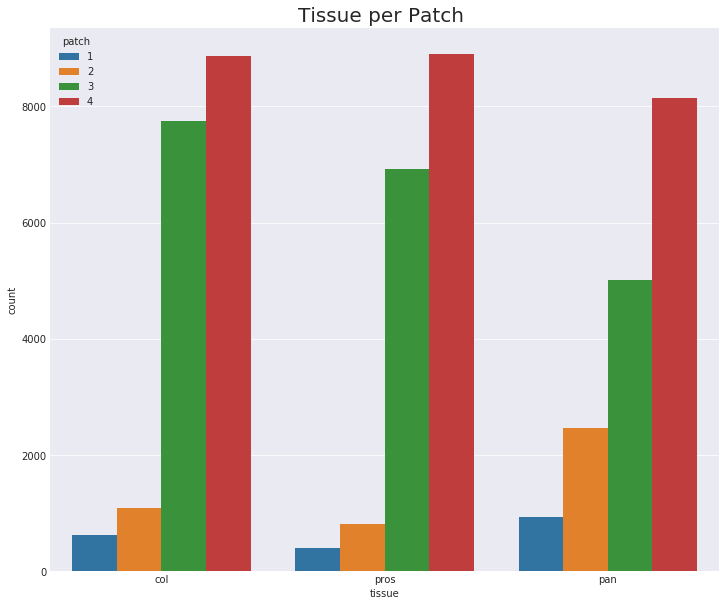

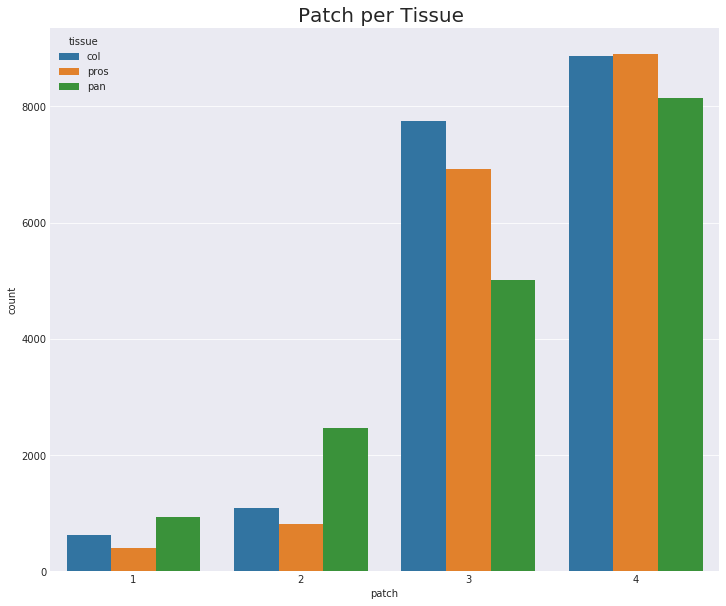

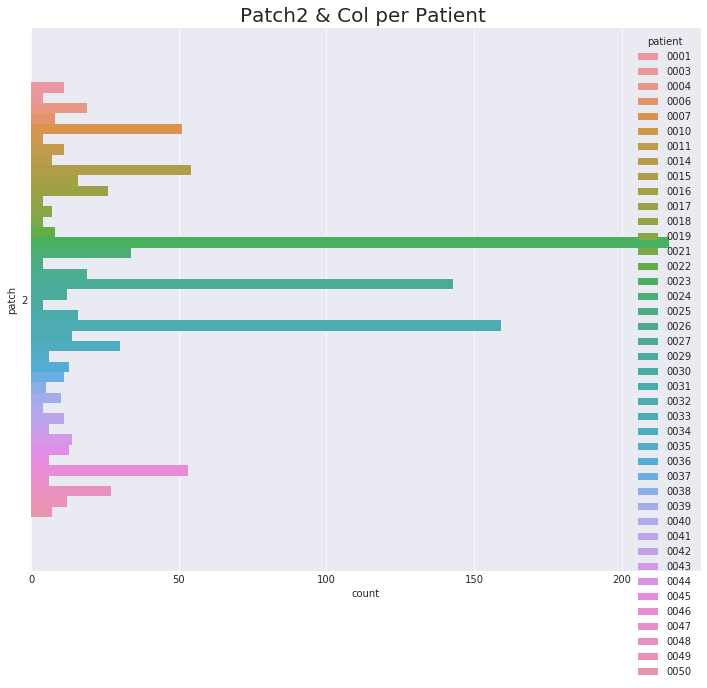

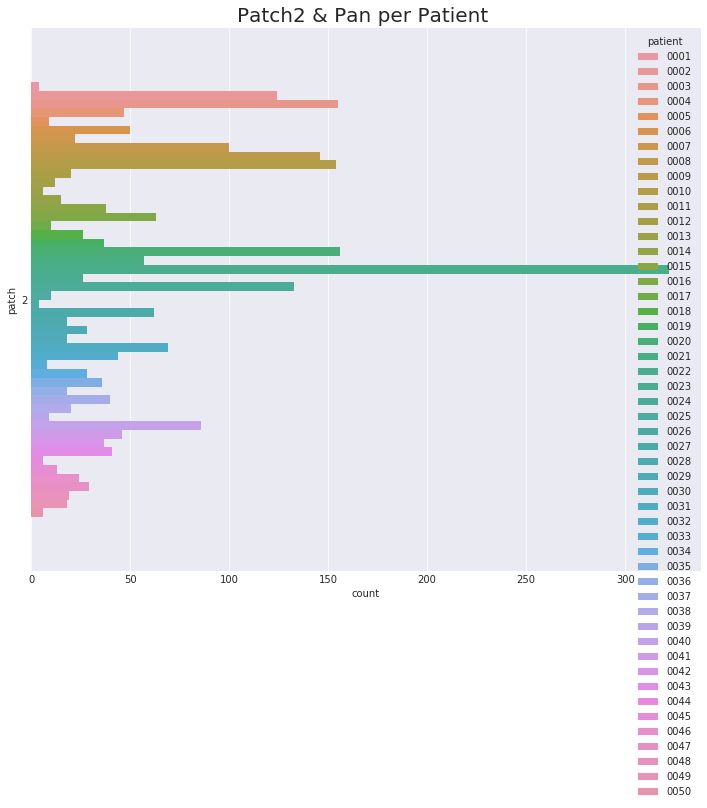

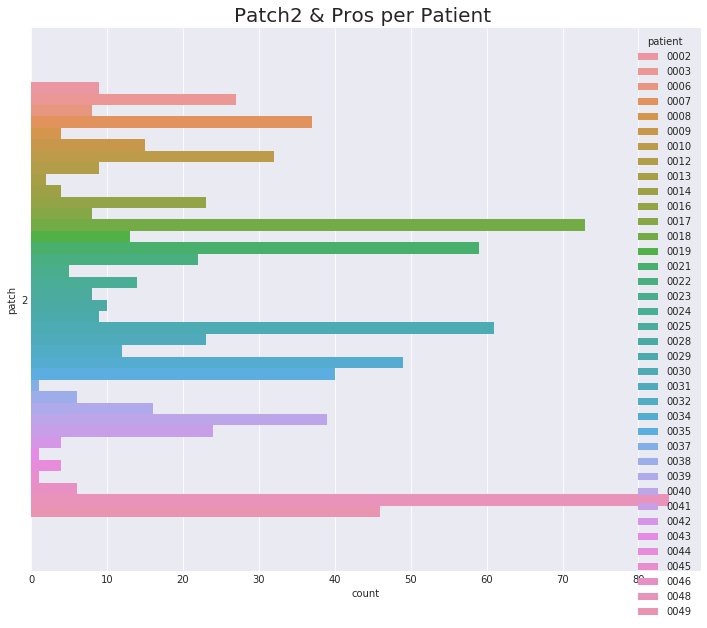

In [16]:
plt.figure(); plt.title('Tissue per Patch ') ;sns.countplot(x = 'tissue',data=df_all,hue='patch')
plt.figure(); plt.title('Patch per Tissue ') ;sns.countplot(x = 'patch',data=df_all,hue='tissue')
plt.figure(); plt.title('Patch2 & Col per Patient ') ;sns.countplot(y = 'patch',data=df_all.query('tissue=="col" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pan per Patient ') ;sns.countplot(y = 'patch',data=df_all.query('tissue=="pan" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pros per Patient ') ;sns.countplot(y = 'patch',data=df_all.query('tissue=="pros" & patch=="2"'),hue='patient')

### TRAIN SET

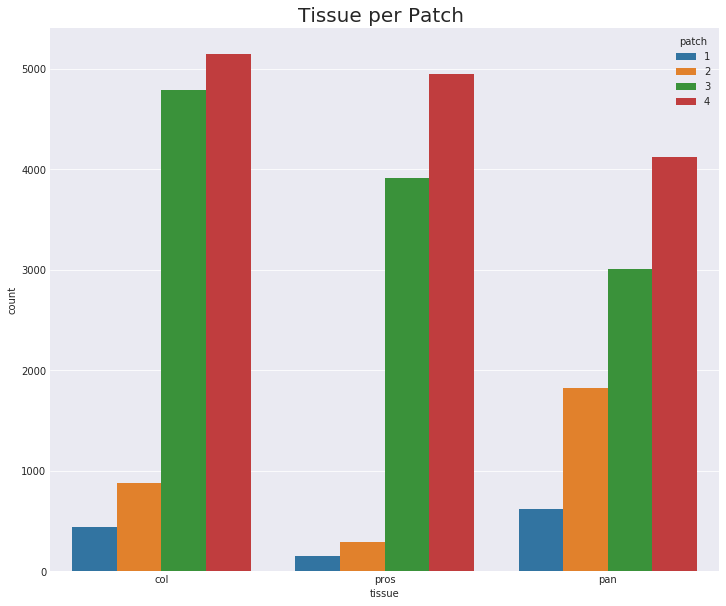

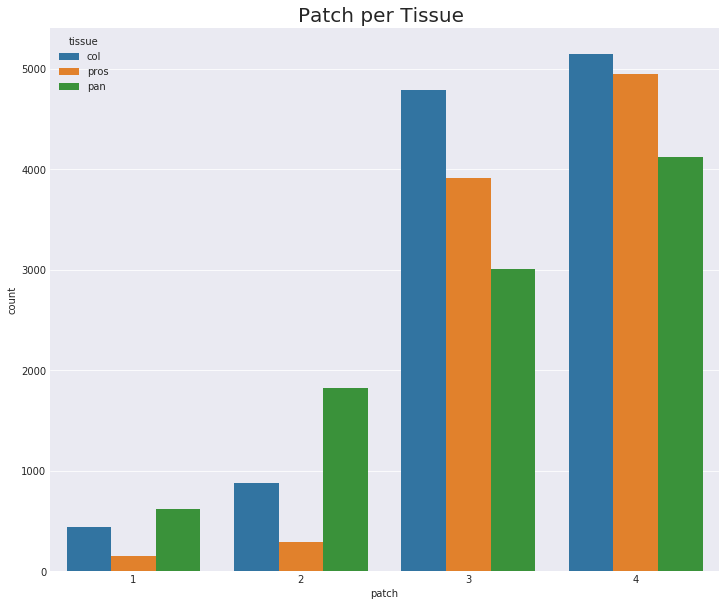

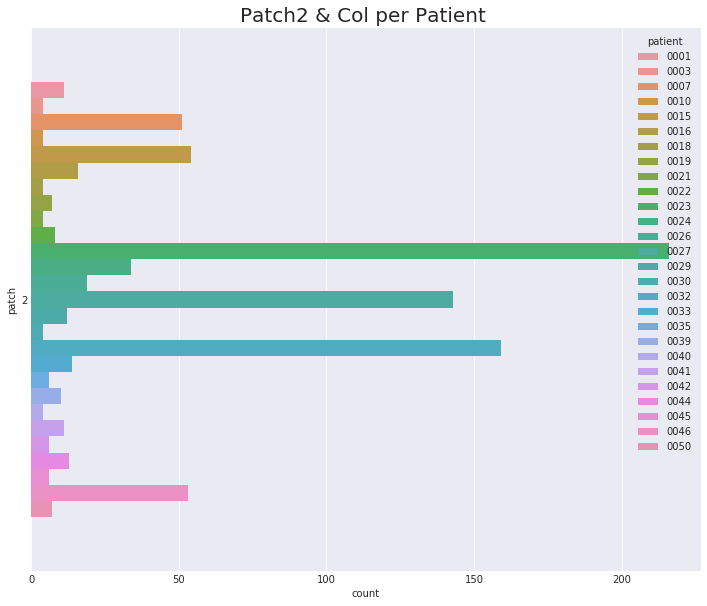

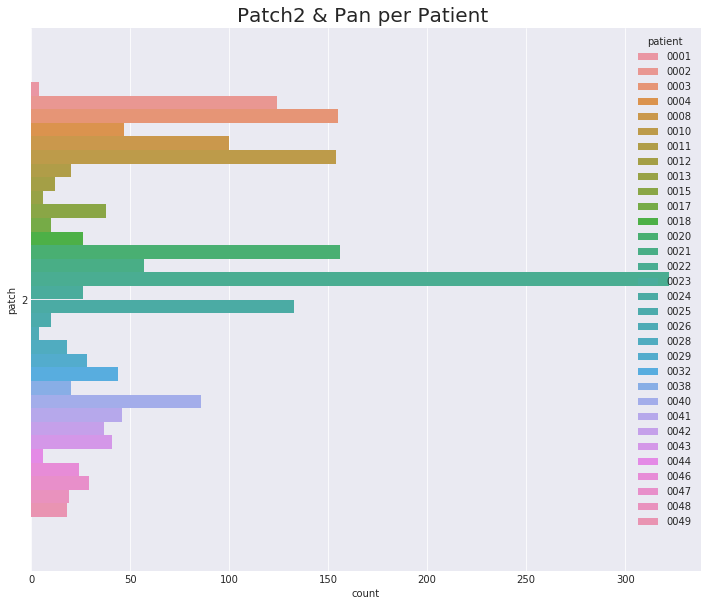

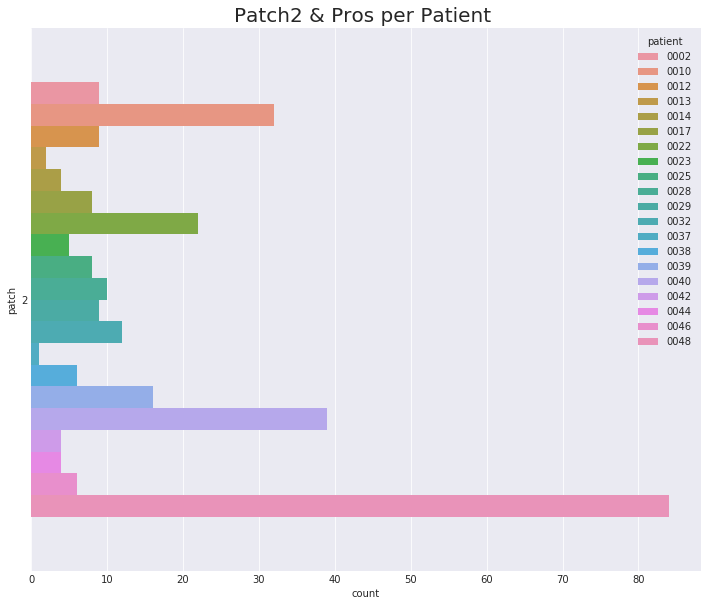

In [17]:
plt.figure(); plt.title('Tissue per Patch ') ;sns.countplot(x = 'tissue',data=df_train,hue='patch')
plt.figure(); plt.title('Patch per Tissue ') ;sns.countplot(x = 'patch',data=df_train,hue='tissue')
plt.figure(); plt.title('Patch2 & Col per Patient ') ;sns.countplot(y = 'patch',data=df_train.query('tissue=="col" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pan per Patient ') ;sns.countplot(y = 'patch',data=df_train.query('tissue=="pan" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pros per Patient ') ;sns.countplot(y = 'patch',data=df_train.query('tissue=="pros" & patch=="2"'),hue='patient')

### VALID SET

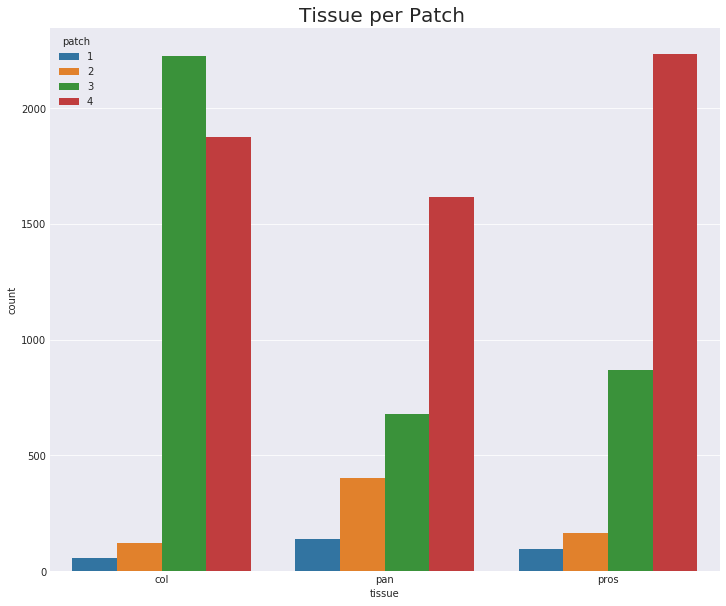

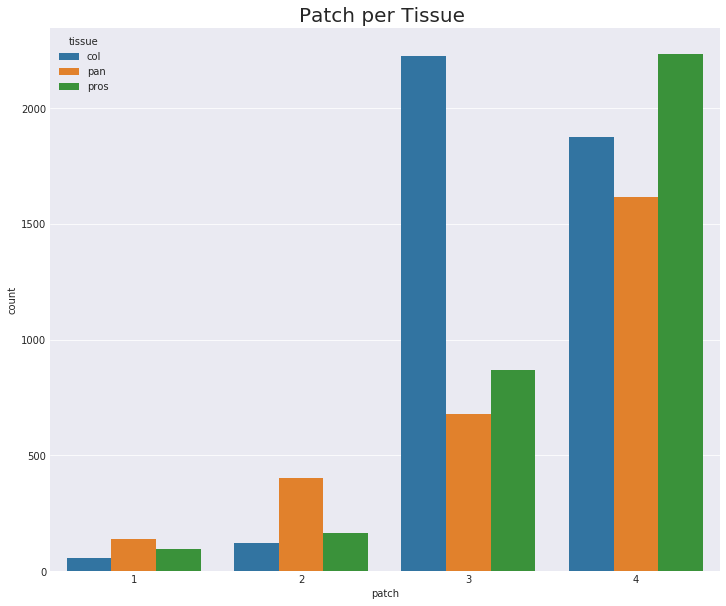

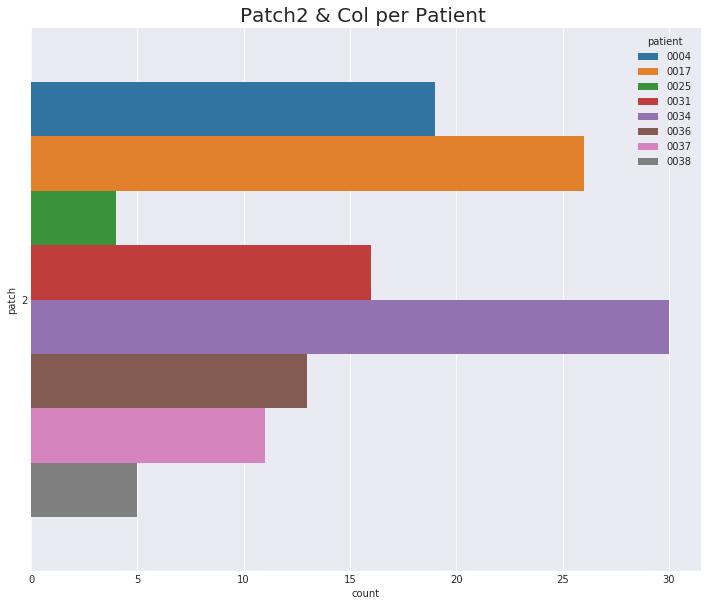

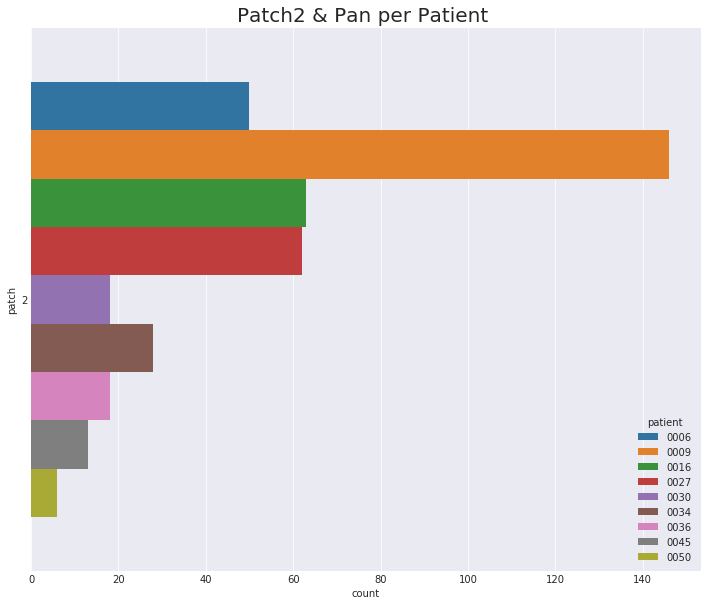

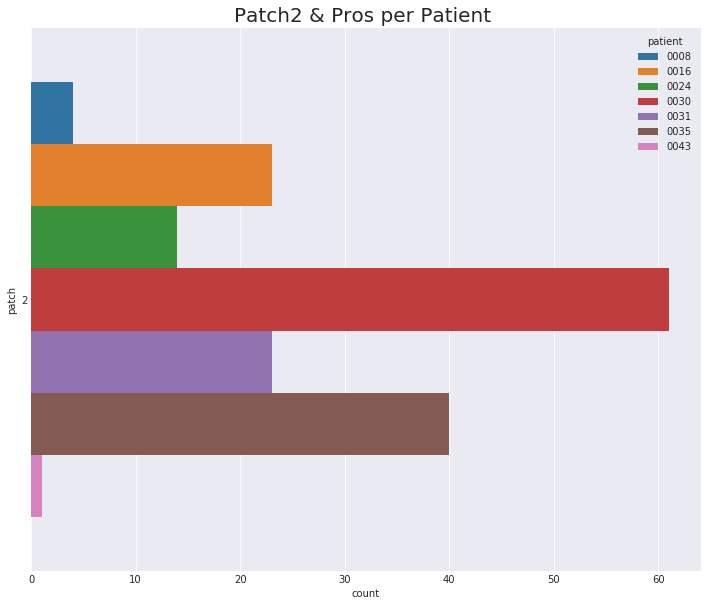

In [18]:
plt.figure(); plt.title('Tissue per Patch ') ;sns.countplot(x = 'tissue',data=df_valid,hue='patch')
plt.figure(); plt.title('Patch per Tissue ') ;sns.countplot(x = 'patch',data=df_valid,hue='tissue')
plt.figure(); plt.title('Patch2 & Col per Patient ') ;sns.countplot(y = 'patch',data=df_valid.query('tissue=="col" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pan per Patient ') ;sns.countplot(y = 'patch',data=df_valid.query('tissue=="pan" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pros per Patient ') ;sns.countplot(y = 'patch',data=df_valid.query('tissue=="pros" & patch=="2"'),hue='patient')

### TEST SET

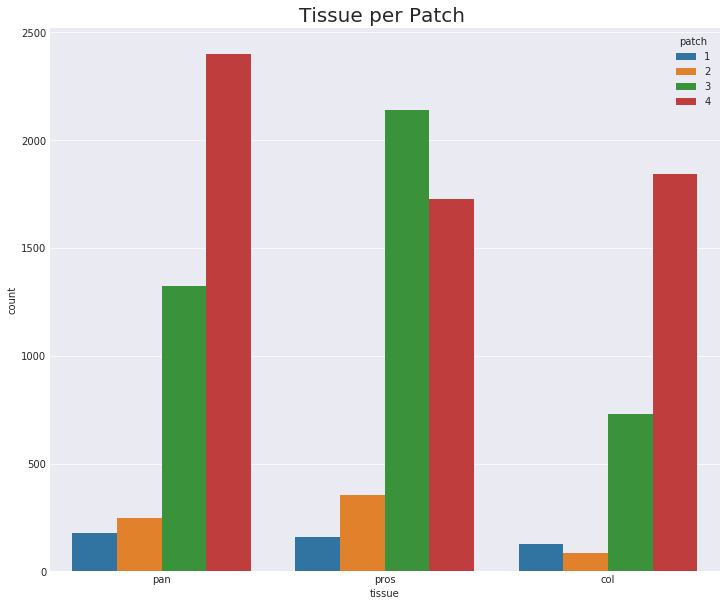

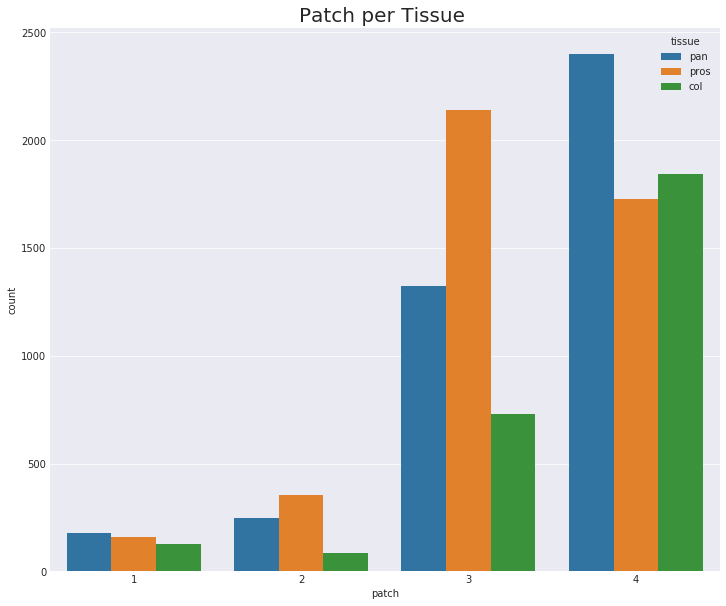

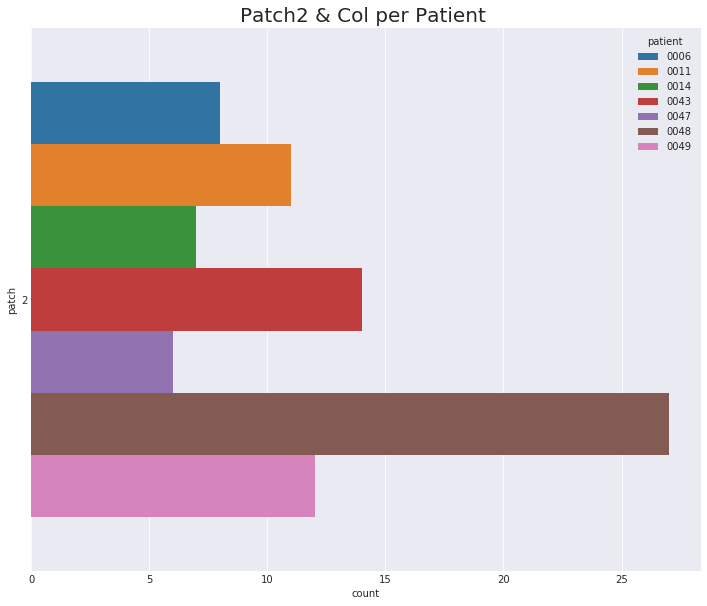

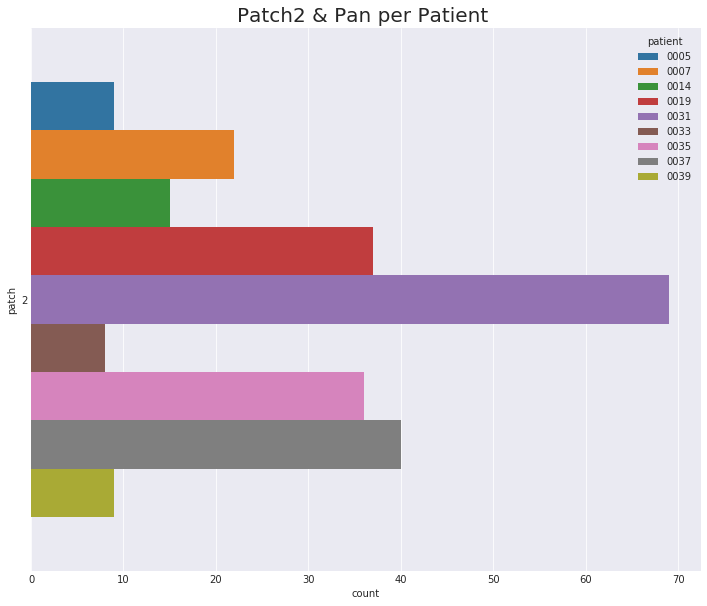

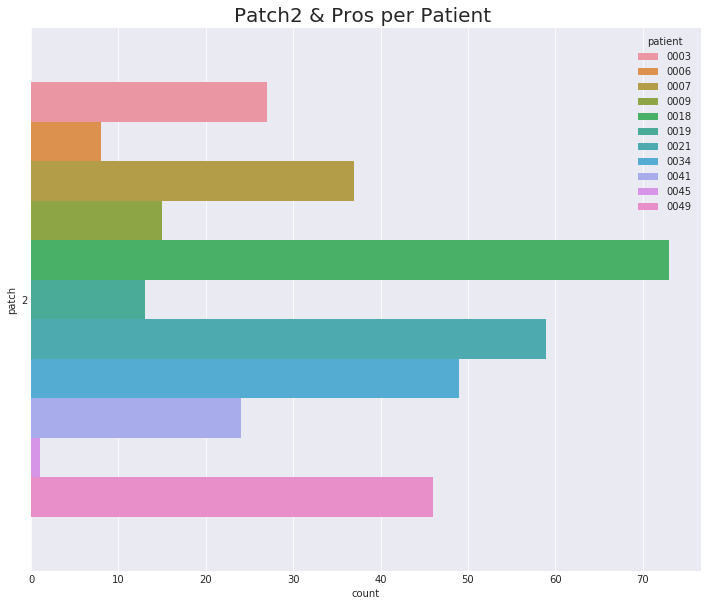

In [19]:
plt.figure(); plt.title('Tissue per Patch ') ;sns.countplot(x = 'tissue',data=df_test,hue='patch')
plt.figure(); plt.title('Patch per Tissue ') ;sns.countplot(x = 'patch',data=df_test,hue='tissue')
plt.figure(); plt.title('Patch2 & Col per Patient ') ;sns.countplot(y = 'patch',data=df_test.query('tissue=="col" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pan per Patient ') ;sns.countplot(y = 'patch',data=df_test.query('tissue=="pan" & patch=="2"'),hue='patient')
plt.figure(); plt.title('Patch2 & Pros per Patient ') ;sns.countplot(y = 'patch',data=df_test.query('tissue=="pros" & patch=="2"'),hue='patient')

### DATAGEN

In [20]:
from datagen import *

In [21]:
train_gen_input = []
for i in range(32):
    train_gen_input.append((df_train.iloc[i]['img_path'],df_train.iloc[i]['mask_path']))
train_gen = clf_generator(len(train_gen_input),(512,512),train_gen_input)

/home/centos/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


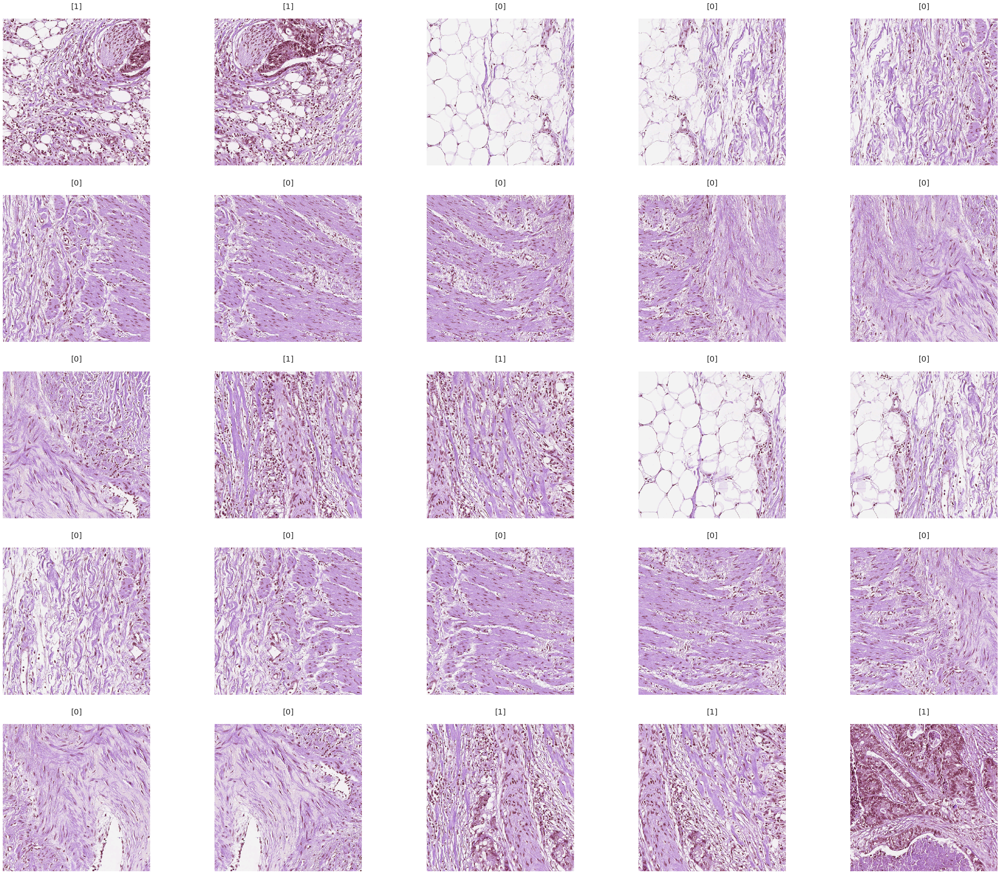

In [22]:
batch_x , batch_y = train_gen.__getitem__(0)
f,ax = plt.subplots(5,5) 
f.subplots_adjust(0,0,3,3)
for i in range(0,5,1):
    for j in range(0,5,1):
        ax[i,j].matshow(batch_x[5*i+j])
        ax[i,j].set_title(batch_y[5*i+j])
        ax[i,j].axis('off')